In [818]:
import sys
!{sys.executable} -m pip install --no-cache-dir opencv-python --upgrade

/bin/bash: /home/hongrach/anaconda3/envs/representation/lib/python3.9/site-packages/cv2/../../../../lib/libtinfo.so.6: no version information available (required by /bin/bash)


In [1]:
import os
import re
import csv
import json
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from collections import defaultdict
from iso639 import languages

import seaborn as sns
from tldextract import extract
import matplotlib.cm as cm

from PIL import Image
import urllib.request as urlopen
from textwrap import wrap
import cv2

# Load metadata

In [2]:
data_dir = '/data/datacomp/'
scale_dir = os.path.join(data_dir, 'small')
metadata_dir = os.path.join(scale_dir, 'metadata')
face_image_dir = os.path.join(scale_dir, 'face_images_100k')

In [3]:
df = None
for filename in os.listdir(metadata_dir):
    filepath = os.path.join(metadata_dir, filename)
    file_df = pd.read_parquet(filepath, engine='pyarrow')
    if df is None:
        df = file_df
    else:
        df = pd.concat([df, file_df], ignore_index=True)

In [4]:
df

,uid,url,text,original_width,original_height,clip_b32_similarity_score,clip_l14_similarity_score,face_bboxes,sha256
0,68ba78085ddc76780dfbceec1e5d42ac,https://photos.smugmug.com/Desert-100/2017-Des...,IMG_1788,300,450,0.216797,0.201050,"[[0.4974687993526459, 0.1723930984735489, 0.60...",6b41923887605276f22fcca29c0e5329881a1657231a6d...
1,1f7b134d137b77f043c2d984c819d099,http://173.214.250.35/76ZwuWvsbgwP082uQJ2VnncH...,Diana frank le klloun,320,240,0.235962,0.123596,"[[0.29118314385414124, 0.08071886003017426, 0....",51e908323fd708b14ce4a435d3879456caa0c1dd362cfa...
2,2a2bb8d1fc6e43d272c009d825d8a423,https://a.wattpad.com/useravatar/thisisastandu...,thisisastandup69,128,128,0.134521,0.151978,"[[0.2151436060667038, 0.33176833391189575, 0.6...",8751821e52e07231305bbe6f8e2dd6169875946ab03202...
3,0c4af8720b06e5e30fd14c9333c69163,https://static.wixstatic.com/media/9f980f_e34c...,lidar 2.JPG,286,190,0.219849,0.258301,"[[0.7299515604972839, 0.14564916491508484, 0.7...",45591f6ef827fdfd322f8bbe5f654486c2220d0cce9454...
4,48bc9d12f9fdbfb7cad8816627a16eb4,https://img1.etsystatic.com/027/0/6615545/il_3...,1 Yd 3/4&quot; Wide Gorgeous Vintage Victorian...,340,270,0.342285,0.301025,"[[0.3746822476387024, 0.005450154189020395, 0....",3bc50d0844aa51e86b690cef5bce91c086f0d9e0afd7ef...
...,...,...,...,...,...,...,...,...,...
12799995,c40d0839d1ef3141925b46e00f4ea974,https://javaearthcoffee.com/wp-content/uploads...,bg1,300,300,0.193604,0.185547,[],14fc9f3a0c5eed76bfa1c28c7aabef67c0709226762565...
12799996,e471e9f3dfc8059c667bf6337f9d190d,https://files.oldi.ru/export/0000000038/046898...,Телефон IP Cisco SPA502G-XU xu rui clustering,800,800,0.279053,0.260742,[],c4791f65a4f7944676ae71a2bf7c5746a41cc23680ad14...
12799997,95db0725c41c82fe1f494f9b6aec8e8a,https://www.masterfoto.lv/209763-home_default/...,"Vairs neražo - Colorama background 1.35x11, se...",250,250,0.303467,0.271484,[],84b497dcc26dc8594c8834b5eded065f20fe104c15f9d6...
12799998,3bc76f4ab48059f5e4af59358c1840f6,http://t1.ftcdn.net/jpg/00/49/95/76/110_F_4995...,"Solaranlage, Strom, Umwelt, Himmel",110,73,0.275879,0.193848,[],9a74892e5bd7bdd43e9675bc4c9c074c0171f5ca7fbd5e...


In [5]:
l14_scores = df['clip_l14_similarity_score'].tolist()
min_threshold = np.percentile(l14_scores, 70)
filtered_df = df[df['clip_l14_similarity_score'] > min_threshold]
excluded_df = df[df['clip_l14_similarity_score'] <= min_threshold]

assert(len(filtered_df) + len(excluded_df) == len(df))
print(len(df), len(filtered_df)) # 12.8M --> 3.94M filtered
print(len(filtered_df) / len(df)) # 30%

12800000 3839815
0.299985546875


In [7]:
df['is_kept'] = df['clip_l14_similarity_score'].apply(lambda x: x > min_threshold)
df

,uid,url,text,original_width,original_height,clip_b32_similarity_score,clip_l14_similarity_score,face_bboxes,sha256,is_kept
0,68ba78085ddc76780dfbceec1e5d42ac,https://photos.smugmug.com/Desert-100/2017-Des...,IMG_1788,300,450,0.216797,0.201050,"[[0.4974687993526459, 0.1723930984735489, 0.60...",6b41923887605276f22fcca29c0e5329881a1657231a6d...,False
1,1f7b134d137b77f043c2d984c819d099,http://173.214.250.35/76ZwuWvsbgwP082uQJ2VnncH...,Diana frank le klloun,320,240,0.235962,0.123596,"[[0.29118314385414124, 0.08071886003017426, 0....",51e908323fd708b14ce4a435d3879456caa0c1dd362cfa...,False
2,2a2bb8d1fc6e43d272c009d825d8a423,https://a.wattpad.com/useravatar/thisisastandu...,thisisastandup69,128,128,0.134521,0.151978,"[[0.2151436060667038, 0.33176833391189575, 0.6...",8751821e52e07231305bbe6f8e2dd6169875946ab03202...,False
3,0c4af8720b06e5e30fd14c9333c69163,https://static.wixstatic.com/media/9f980f_e34c...,lidar 2.JPG,286,190,0.219849,0.258301,"[[0.7299515604972839, 0.14564916491508484, 0.7...",45591f6ef827fdfd322f8bbe5f654486c2220d0cce9454...,True
4,48bc9d12f9fdbfb7cad8816627a16eb4,https://img1.etsystatic.com/027/0/6615545/il_3...,1 Yd 3/4&quot; Wide Gorgeous Vintage Victorian...,340,270,0.342285,0.301025,"[[0.3746822476387024, 0.005450154189020395, 0....",3bc50d0844aa51e86b690cef5bce91c086f0d9e0afd7ef...,True
...,...,...,...,...,...,...,...,...,...,...
12799995,c40d0839d1ef3141925b46e00f4ea974,https://javaearthcoffee.com/wp-content/uploads...,bg1,300,300,0.193604,0.185547,[],14fc9f3a0c5eed76bfa1c28c7aabef67c0709226762565...,False
12799996,e471e9f3dfc8059c667bf6337f9d190d,https://files.oldi.ru/export/0000000038/046898...,Телефон IP Cisco SPA502G-XU xu rui clustering,800,800,0.279053,0.260742,[],c4791f65a4f7944676ae71a2bf7c5746a41cc23680ad14...,True
12799997,95db0725c41c82fe1f494f9b6aec8e8a,https://www.masterfoto.lv/209763-home_default/...,"Vairs neražo - Colorama background 1.35x11, se...",250,250,0.303467,0.271484,[],84b497dcc26dc8594c8834b5eded065f20fe104c15f9d6...,True
12799998,3bc76f4ab48059f5e4af59358c1840f6,http://t1.ftcdn.net/jpg/00/49/95/76/110_F_4995...,"Solaranlage, Strom, Umwelt, Himmel",110,73,0.275879,0.193848,[],9a74892e5bd7bdd43e9675bc4c9c074c0171f5ca7fbd5e...,False


In [8]:
raw_captions = df['text'].tolist()
filtered_captions = filtered_df['text'].tolist()
excluded_captions = excluded_df['text'].tolist()

# Identity keywords

In [719]:
identity_keywords_dict = {
    'gender': [
        r'\bwom[ae]n\b',
        r'\bfemales?\b',
        r'\bm[ae]n\b',
        r'\bmales?\b',
        r'\bnon[ -]?binary\b',
        r'\btrans(|\+|gender)\b',
        
        r'\b(she|her|hers)\b',
        r'\b(he|him|his)\b',
        r'\b(they|them|theirs)\b',
    ],
    'sexual_orientation': [
        r'\bhomosexuals?\b',
        r'\bgays?\b',
        r'\blesbians?\b',
        r'\bstraights?\b',
        r'\bheterosexuals?\b',
        r'\bbi-?sexuals?\b',
    ],
    'race': [
        r'\bblacks?\b',
        r'\bafrican([ -]american)?s?\b',
        r'\blatin[oax]?s?\b',
        r'\basian([ -]american)?s?\b',
        r'\bwhites?\b',
        r'\bcaucasians?\b',
        r'\beuropean([ -]american)?s?\b',
    ],
    'religion': [
        r'\bmuslims?\b',
        r'\bjew(|s|ish)?\b',
        r'\bchristians?\b',
    ]   
}

demographics = list(identity_keywords_dict.keys())

identity_keywords = []
for d in identity_keywords_dict:
    for keyword in identity_keywords_dict[d]:
        identity_keywords.append(keyword)
print(identity_keywords)

['\\bwom[ae]n\\b', '\\bfemales?\\b', '\\bm[ae]n\\b', '\\bmales?\\b', '\\bnon[ -]?binary\\b', '\\btrans(|\\+|gender)\\b', '\\b(she|her|hers)\\b', '\\b(he|him|his)\\b', '\\b(they|them|theirs)\\b', '\\bhomosexuals?\\b', '\\bgays?\\b', '\\blesbians?\\b', '\\bstraights?\\b', '\\bheterosexuals?\\b', '\\bbi-?sexuals?\\b', '\\bblacks?\\b', '\\bafrican([ -]american)?s?\\b', '\\blatin[oax]?s?\\b', '\\basian([ -]american)?s?\\b', '\\bwhites?\\b', '\\bcaucasians?\\b', '\\beuropean([ -]american)?s?\\b', '\\bmuslims?\\b', '\\bjew(|s|ish)?\\b', '\\bchristians?\\b']


In [720]:
len(raw_captions), len(filtered_captions)

(12800000, 3839815)

# Face images

In [721]:
face_df = df[df['face_bboxes'].apply(len).gt(0)]
print(len(face_df) / len(df))
face_df # 3.2M faces (out of 12.8M)

0.25207453125


,uid,url,text,original_width,original_height,clip_b32_similarity_score,clip_l14_similarity_score,face_bboxes,sha256
0,68ba78085ddc76780dfbceec1e5d42ac,https://photos.smugmug.com/Desert-100/2017-Des...,IMG_1788,300,450,0.216797,0.201050,"[[0.4974687993526459, 0.1723930984735489, 0.60...",6b41923887605276f22fcca29c0e5329881a1657231a6d...
1,1f7b134d137b77f043c2d984c819d099,http://173.214.250.35/76ZwuWvsbgwP082uQJ2VnncH...,Diana frank le klloun,320,240,0.235962,0.123596,"[[0.29118314385414124, 0.08071886003017426, 0....",51e908323fd708b14ce4a435d3879456caa0c1dd362cfa...
2,2a2bb8d1fc6e43d272c009d825d8a423,https://a.wattpad.com/useravatar/thisisastandu...,thisisastandup69,128,128,0.134521,0.151978,"[[0.2151436060667038, 0.33176833391189575, 0.6...",8751821e52e07231305bbe6f8e2dd6169875946ab03202...
3,0c4af8720b06e5e30fd14c9333c69163,https://static.wixstatic.com/media/9f980f_e34c...,lidar 2.JPG,286,190,0.219849,0.258301,"[[0.7299515604972839, 0.14564916491508484, 0.7...",45591f6ef827fdfd322f8bbe5f654486c2220d0cce9454...
4,48bc9d12f9fdbfb7cad8816627a16eb4,https://img1.etsystatic.com/027/0/6615545/il_3...,1 Yd 3/4&quot; Wide Gorgeous Vintage Victorian...,340,270,0.342285,0.301025,"[[0.3746822476387024, 0.005450154189020395, 0....",3bc50d0844aa51e86b690cef5bce91c086f0d9e0afd7ef...
...,...,...,...,...,...,...,...,...,...
12799968,b3654c4dad4ac3de5d77fa434976d59d,https://daaam.info/wp-content/gallery/DAAAM_20...,daaam_2017_zadar_17_the_6th_ds_city_walk_033,240,160,0.307373,0.224243,"[[0.7017708420753479, 0.43615323305130005, 0.7...",42ba7028f6320a2dffeb26f9c095aa7f754ac515accd61...
12799970,c5ecc238130ebc7c5fa86ef6eb4d7a79,https://stopga.me/images/games/logos/13380/c17...,Rambo: The Video Game: Обзор,170,119,0.339111,0.277832,"[[0.5128694772720337, 0.45578712224960327, 0.5...",30f43f8d377e1cebdea9e948de022eff66381bcbe6f0a3...
12799971,3845815c9a54174b75b18dca0647d80d,http://sk-menina.si/wp-content/uploads/2016/09...,OLYMPUS DIGITAL CAMERA,150,113,0.207031,0.063232,"[[0.690801203250885, 0.635551929473877, 0.7224...",ee1e1e2442815641099b42b581f75497e456f4c3137164...
12799974,4e8a5d4b94973937315174b8dd593eae,https://jamesdboys.files.wordpress.com/2013/12...,IMG_6468,300,225,0.152344,0.052338,"[[0.6176501512527466, 0.28104838728904724, 0.6...",9208452d102c5b8391d367f62cec6c1ecdb73356ee0ec1...


In [722]:
l14_scores = df['clip_l14_similarity_score'].tolist()
min_threshold = np.percentile(l14_scores, 70)
filtered_face_df = face_df[face_df['clip_l14_similarity_score'] > min_threshold]
excluded_face_df = face_df[face_df['clip_l14_similarity_score'] <= min_threshold]

assert(len(filtered_face_df) + len(excluded_face_df) == len(face_df))
print(len(face_df), len(filtered_face_df)) # 12.8M --> 3.94M filtered
print(len(filtered_face_df) / len(face_df)) # 30%

3226554 898699
0.27853214296119017


In [723]:
raw_face_captions = face_df['text'].tolist()
filtered_face_captions = filtered_face_df['text'].tolist()
excluded_face_captions = excluded_face_df['text'].tolist()

## Download face images

In [389]:
import socket
socket.setdefaulttimeout(10)

opener = urlopen.build_opener()
opener.addheaders = [('User-Agent', 'Chrome')]
urlopen.install_opener(opener)

face_image_dir

'/data/datacomp/small/face_images'

In [932]:
def get_face_box(img, box):
    assert(len(box) >= 4)
        
    h = int(img.shape[0])
    w = int(img.shape[1])

    w1 = int(box[0] * w)
    h1 = int(box[1] * h)
    w2 = int(box[2] * w)
    h2 = int(box[3] * h)

    return (w1, h1, w2, h2)

#     if len(img.shape) == 2:
#         face_img = img[h1:h2, w1:w2]
#     elif img.shape[-1] == 4:
#         face_img = img[h1:h2, w1:w2, :3]
#     else:
#         face_img = img[h1:h2, w1:w2, :]
#     return face_img

def download_image(row, download=False):
    uid = row['uid']
    url = row['url']
    ext = url.split('.')[-1]
    if len(ext) > 4 or len(ext) == 0:
        ext = 'jpg'
    image_path = os.path.join(face_image_dir, uid + '.' + ext)
    
#     print(url)
    
    if download:
        if not os.path.isfile(image_path):
            r = requests.get(url, stream=True, timeout=5)
            if r.status_code == 200:
                with open(image_path, 'wb') as f:
                    r.raw.decode_content = True
                    shutil.copyfileobj(r.raw, f)

    #         if not issubclass(face_img.dtype.type, np.integer):
    #             face_img = face_img * 255
    #         Image.fromarray((face_img).astype(np.uint8)).save(image_path)
        else:
            return None # do nothing because file already exists
    else:
        if not os.path.isfile(image_path):
            return None

    img = cv2.imread(image_path)
    return img

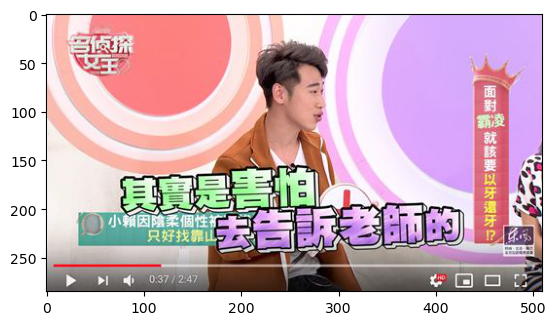

In [497]:
sample_row = sample_face_df.iloc[0]
img = download_image(sample_row, download=True)
img2 = img[:,:,::-1]
plt.imshow(img2)
plt.show()

## Random sample of faces

In [498]:
random.seed(0)
NUM_SAMPLE = 100000
sample_face_df = face_df.sample(2 * NUM_SAMPLE, random_state=0)

i = 0
for _, row in sample_face_df.iterrows():
    if i < 9463:
        i += 1
        continue

    if i% 1000 == 0:
        print(i)

    try:
        img = download_image(row)
#         plt.imshow(img)
#         plt.show()
    except Exception as e:
        print(i, "ERROR", e)

    i += 1

In [502]:
sample_face_df[['uid', 'url']].iloc[0]['url'] #.to_csv('sample_face_df.csv', index=False)


'https://img.cdn.schooljotter2.com/sampled/14808122/120/90/nocrop//'

## Gender classifier

In [725]:
model_dir = '/home/hongrach/datafiltering/notebooks/age_gender_models'

age1 = os.path.join(model_dir, "deploy_age.prototxt")
age2 = os.path.join(model_dir, "age_net.caffemodel")
gen1 = os.path.join(model_dir, "deploy_gender.prototxt")
gen2 = os.path.join(model_dir, "gender_net.caffemodel")

In [726]:
MODEL_MEAN_VALUES = (78.4263377603, 87.7689143744, 114.895847746) # is this right?
 
age_model = cv2.dnn.readNet(age2, age1) 
gender_model = cv2.dnn.readNet(gen2, gen1) 

In [727]:
AGE_LABELS = ['(0-2)', '(4-6)', '(8-12)', '(15-20)', 
      '(25-32)', '(38-43)', '(48-53)', '(60-100)'] 
GENDER_LABELS = ['Male', 'Female'] 

In [899]:
GENDER_CONFIDENCE = 0.99
AGE_CONFIDENCE = 0.99

def predict_face(face_img):
    if face_img.shape[0] < 40 and face_img.shape[1] < 40:
        return (None, None)

    blob = cv2.dnn.blobFromImage( 
        face_img, 1.0, (256, 256), MODEL_MEAN_VALUES, swapRB=False
    )

    #Prediction of gender 
    gender_model.setInput(blob) 
    gender_preds = gender_model.forward() 
    gender_index = gender_preds[0].argmax()
    
    if gender_preds[0][gender_index] > GENDER_CONFIDENCE:
        gender = GENDER_LABELS[gender_index]
    else:
        gender = None

    #Prediction of age 
    age_model.setInput(blob) 
    age_preds = age_model.forward()
    age_index = age_preds[0].argmax()
    
    if age_preds[0][age_index] > AGE_CONFIDENCE:
        age = AGE_LABELS[age_index]
    else:
        age = None

    return (gender, age)

In [933]:
face_classifier = cv2.CascadeClassifier(
    "/home/hongrach/anaconda3/envs/representation/lib/python3.9/site-packages/cv2/data/haarcascade_frontalface_default.xml"
)

def detect_face(img):
    boxes = face_classifier.detectMultiScale(
        img, scaleFactor=1.1, minNeighbors=5, minSize=(40, 40)
    )
    return([(box[0], box[1], box[0] + box[2], box[1] + box[3]) for box in boxes])

def get_age_gender_of_row(row, show=False, dest_ax=None, use_opencv=False):
    img = download_image(row, download=False)
    if img is None:
        return []

    if show:
        if dest_ax is None:
            fig, ax = plt.subplots()
        else:
            ax = dest_ax
        ax.imshow(img[:,:,::-1])

    if use_opencv:
        print("USING OPENCV")
        boxes = detect_face(img)
    else:
        bboxes = row['face_bboxes']
        boxes = [get_face_box(img, box) for box in bboxes] # w1, h1, w2, h2 --> img[h1: h2, w1: w2]

    face_annotations = []
    for (w1, h1, w2, h2) in boxes:
        final_h1 = max(0, h1-15)
        final_h2 = min(h2+15, img.shape[0]-1)
        final_w1 = max(0, w1-15)
        final_w2 = min(w2+15, img.shape[1]-1)

        face_img = img[final_h1: final_h2, final_w1: final_w2]
        (gender, age) = predict_face(face_img)
        if gender != None or age != None:
            face_annotations.append((gender, age))
        
        if show:
            ax.text(final_w1, final_h1, f'{gender}, {age}', color='red')

            rect = patches.Rectangle(
                (final_w1, final_h1), (final_w2 - final_w1), (final_h2 - final_h1),
                linewidth=1, edgecolor='r', facecolor='none'
            )
            ax.add_patch(rect)
    if show and dest_ax is None:
        plt.show()

    return face_annotations

In [927]:
sample_uids = []
for filename in os.listdir(face_image_dir):
    uid = filename.split('.')[0]
    sample_uids.append(uid)

In [935]:
# NUM_SAMPLE = 10000
sample_rows = face_df.loc[face_df['uid'].isin(sample_uids)]
# sample_rows = sample_rows.sample(NUM_SAMPLE)
len(sample_rows)

163351

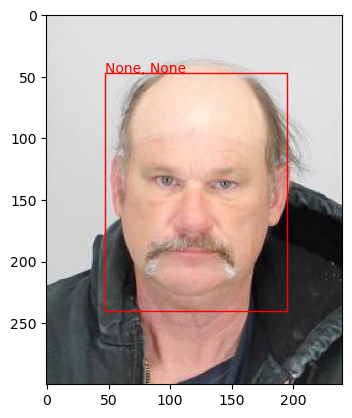

[]

In [898]:
get_age_gender_of_row(sample_rows.iloc[8], show=True, use_opencv=False)

##### Track filter

In [936]:
filtered_face_uids = set(filtered_face_df['uid'].unique())
print(len(filtered_face_uids))

results = {}

898699


In [998]:
i = 0
for _, row in sample_rows.iterrows():
    uid = row['uid']
    if i < 19522 or uid in results:
        i += 1
        continue

    print(i)
    try:
        face_annotations = get_age_gender_of_row(row)

        results[uid] = face_annotations

    except Exception as e:
        print('ERROR', e)
    i += 1

19522
19523
19524
19525
19526
19527
19528
19529
19530
19531
19532
19533
19534
19535
19536
19537
19538
19539
19540
19541
19542
19543
19544
19545
19546
19547
19548
19549
19550
19551
19552
19553
19554
19555
19556
19557
19558
19559
19560
19561
19562
19563
19564
19565
19566
19567
19568
19569
19570
19571
19572
19573
19574
19575
19576
19577
19578
19579
19580
19581
19582
19583
19584
19585
19586
19587
19588
19589
19590
19591
19592
19593
19594
19595
19596
19597
19598
19599
19600
19601
19602
19603
19604
19605
19606
19607
19608
19609
19610
19611
19612
19613
19614
19615
19616
19617
19618
19619
19620
19621
19622
19623
19624
19625
19626
19627
19628
19629
19630
19631
19632
19633
19634
19635
19636
19637
19638
19639
19640
19641
19642
19643
19644
19645
19646
19647
19648
19649
19650
19651
19652
19653
19654
19655
19656
19657
19658
19659
19660
19661
19662
19663
19664
19665
19666
19667
19668
19669
19670
19671
19672
19673
19674
19675
19676
19677
19678
19679
19680
19681
19682
19683
19684
19685
19686
19687
1968

KeyboardInterrupt: 

In [999]:
n_not_null = 0
for uid in results:
    if len(results[uid]) > 0:
        n_not_null += 1
print(len(sample_rows), len(results))
print(n_not_null)

163351 19954
11036


In [1000]:
import json
with open('face_gender_age.json', 'w') as fp:
    json.dump(results, fp)

In [1006]:
gender_count = {'Male': defaultdict(int), 'Female': defaultdict(int)}
# {'Male': {'filtered': X, 'total': X}, 'Female': {'filtered': X, 'total': X}}

age_count = {} # {'(X, X)': {'filtered': X, 'total': X}}
for a in AGE_LABELS:
    age_count[a] = defaultdict(int)
    
age_gender_count = {} # {'(X, X)': {'filtered': X, 'total': X}}
for g in GENDER_LABELS:
    for a in AGE_LABELS:
        k = g + ' ' + a
        age_gender_count[k] = defaultdict(int)

for uid in results:
    is_filtered = uid in filtered_face_uids
    
    for (g, a) in results[uid]:
        if g != None:
            gender_count[g]['total'] += 1
            if is_filtered:
                gender_count[g]['filtered'] += 1
        if a != None:
            age_count[a]['total'] += 1
            if is_filtered:
                age_count[a]['filtered'] += 1
        if g != None and a != None:
            k = g + ' ' + a
            age_gender_count[k]['total'] += 1
            if is_filtered:
                age_gender_count[k]['filtered'] += 1

In [616]:
def get_error(filter_num, raw_num):
    pos_list = [1] * filter_num
    neg_list = [0] * (raw_num - filter_num)
    err = np.std(pos_list + neg_list)
    return err / np.sqrt(raw_num)

Male 0.00524482402642488
Female 0.004625536661452261


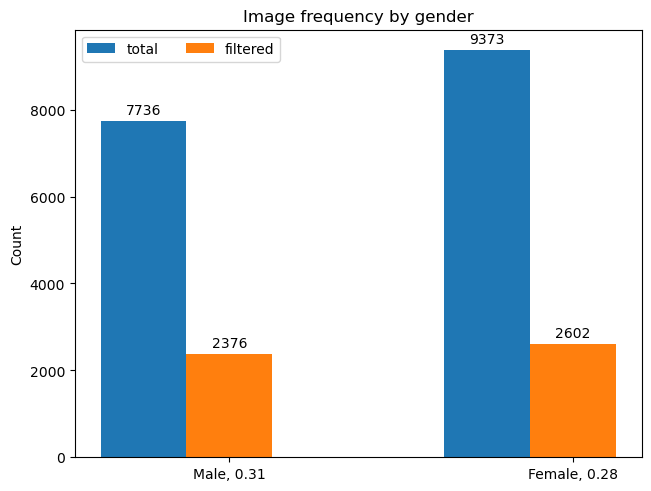

In [1004]:
# bar graph: GENDER

graph_results = defaultdict(list)

ratio_by_g = {}
for g in GENDER_LABELS:
    print(g, get_error(gender_count[g]['filtered'], gender_count[g]['total']))
    ratio_by_g[g] = gender_count[g]['filtered'] / gender_count[g]['total']
    for k in gender_count[g]:
        graph_results[k].append(gender_count[g][k])

x = np.arange(len(GENDER_LABELS))  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(layout='constrained')

for k, v in graph_results.items():
    offset = width * multiplier
    rects = ax.bar(x + offset, v, width=width, label=k)
    ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Count')
ax.set_title('Image frequency by gender')
ax.set_xticks(x + width, [g + ', %.2f' % ratio_by_g[g] for g in GENDER_LABELS])
ax.legend(loc='upper left', ncols=3)

plt.show()

[230, 645, 504, 138, 1640, 30, 25, 127]
[81, 160, 164, 37, 507, 10, 9, 40]


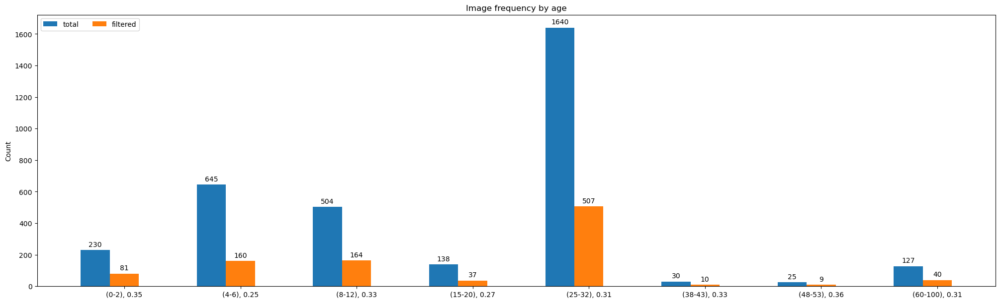

In [1005]:
# bar graph: AGE

graph_results = defaultdict(list)

ratio_by_g = {}
for g in AGE_LABELS:
    ratio_by_g[g] = age_count[g]['filtered'] / age_count[g]['total']
    for k in age_count[g]:
        graph_results[k].append(age_count[g][k])

x = np.arange(len(AGE_LABELS))  # the label locations
width = 0.25  # the width of the bars
multiplier = 0

fig, ax = plt.subplots(layout='constrained', figsize=(20, 6))

for k, v in graph_results.items():
    print(v)
    offset = width * multiplier
    rects = ax.bar(x + offset, v, width=width, label=k)
    ax.bar_label(rects, padding=3)
    multiplier += 1

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Count')
ax.set_title('Image frequency by age')
ax.set_xticks(x + width, [g + ', %.2f' % ratio_by_g[g] for g in AGE_LABELS])
ax.legend(loc='upper left', ncols=3)

plt.show()

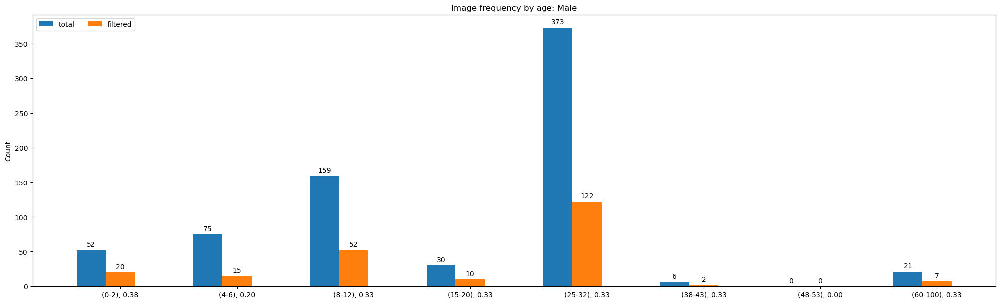

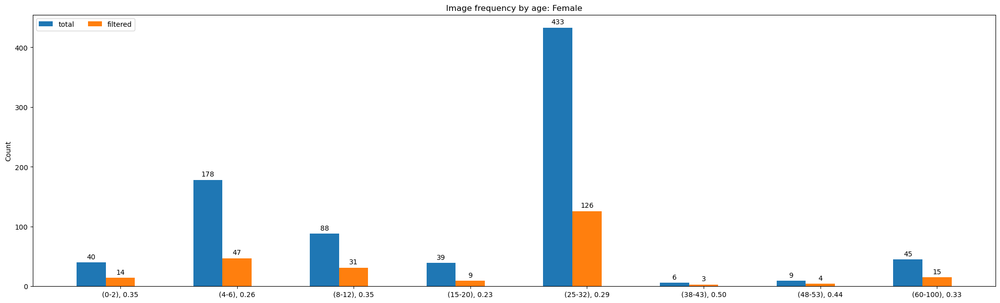

In [1009]:
# bar graph: AGE and GENDER

def show_graph_by_gender(gender):
    graph_results = defaultdict(list)

    ratio_by_g = {}
    for g in AGE_LABELS:
        key = gender + ' ' + g
        if age_gender_count[key]['total'] > 0:
            ratio_by_g[g] = age_gender_count[key]['filtered'] / age_gender_count[key]['total']
        else:
            ratio_by_g[g] = 0
        for k in age_gender_count[key]:
            graph_results[k].append(age_gender_count[key][k])

    x = np.arange(len(AGE_LABELS))  # the label locations
    width = 0.25  # the width of the bars
    multiplier = 0

    fig, ax = plt.subplots(layout='constrained', figsize=(20, 6))

    for k, v in graph_results.items():
        offset = width * multiplier
        rects = ax.bar(x + offset, v, width=width, label=k)
        ax.bar_label(rects, padding=3)
        multiplier += 1

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel('Count')
    ax.set_title('Image frequency by age: ' + gender)
    ax.set_xticks(x + width, [g + ', %.2f' % ratio_by_g[g] for g in AGE_LABELS])
    ax.legend(loc='upper left', ncols=3)

    plt.show()

show_graph_by_gender(GENDER_LABELS[0])
show_graph_by_gender(GENDER_LABELS[1])

## View images

In [760]:
NUM_SAMPLE = 25
NUM_COL = 5
NUM_ROW = NUM_SAMPLE // NUM_COL

def display_sample(sample, bounding_box=False):
    resample = sample.sample(NUM_SAMPLE)
    
    fig, axes = plt.subplots(NUM_ROW, NUM_COL, figsize=(15,3 * NUM_ROW))
    fig.tight_layout(pad=2.0)

    i = 0
    for _, row in resample.iterrows():
        if i >= NUM_SAMPLE:
            break

        try:
            img = download_image(row, download=True)
            caption = row['text']
            
            ax = axes[i // NUM_COL][i % NUM_COL]
            if bounding_box:
                _ = get_age_gender_of_row(row, show=True, dest_ax=ax)
            else:
                ax.imshow(img[:,:,::-1])

            ax.set_title("\n".join(wrap(caption, 60)), fontsize=8)
            i += 1
        except Exception as e:
            print("ERROR", e)
            i += 1
            pass
            
    plt.show()

gender [0.07597728 0.92402273]
age [2.0355321e-03 3.9099452e-01 3.6821511e-02 4.3078267e-04 4.5521662e-01
 1.8876791e-02 8.9778565e-02 5.8458019e-03]
gender [0.92813814 0.07186183]
age [2.3754228e-07 2.7036080e-07 1.2146673e-04 4.3747292e-04 9.5852244e-01
 3.7205264e-02 2.8304176e-03 8.8230951e-04]
gender [9.1501413e-04 9.9908495e-01]
age [1.0745071e-06 2.7779802e-03 9.9249047e-01 6.5236178e-04 4.0007834e-03
 5.5466026e-05 1.6044874e-05 5.6605195e-06]
gender [0.85815144 0.1418486 ]
age [0.300586   0.21140325 0.02233676 0.01148722 0.24509892 0.17012429
 0.02703948 0.01192408]
gender [6.1691171e-05 9.9993825e-01]
age [5.1623385e-07 2.7001335e-07 8.1542221e-06 1.2681500e-05 3.0633721e-05
 1.7960578e-03 1.1478853e-02 9.8667288e-01]
gender [0.0165026 0.9834974]
age [0.00175526 0.02923974 0.01869317 0.80455935 0.00271902 0.02061451
 0.00400297 0.11841597]
gender [0.9687146  0.03128546]
age [1.2974415e-04 1.5983012e-02 9.2768198e-01 4.2145145e-03 1.1163057e-02
 4.0235311e-02 1.7947140e-04 4.1

/home/hongrach/anaconda3/envs/representation/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 24180 (\N{CJK UNIFIED IDEOGRAPH-5E74}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/home/hongrach/anaconda3/envs/representation/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 20472 (\N{CJK UNIFIED IDEOGRAPH-4FF8}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/home/hongrach/anaconda3/envs/representation/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 12510 (\N{KATAKANA LETTER MA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/home/hongrach/anaconda3/envs/representation/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 12540 (\N{KATAKANA-HIRAGANA PROLONGED SOUND MARK}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/home/hongrach/anaconda3/envs/representation/lib/python3.9/site-pack

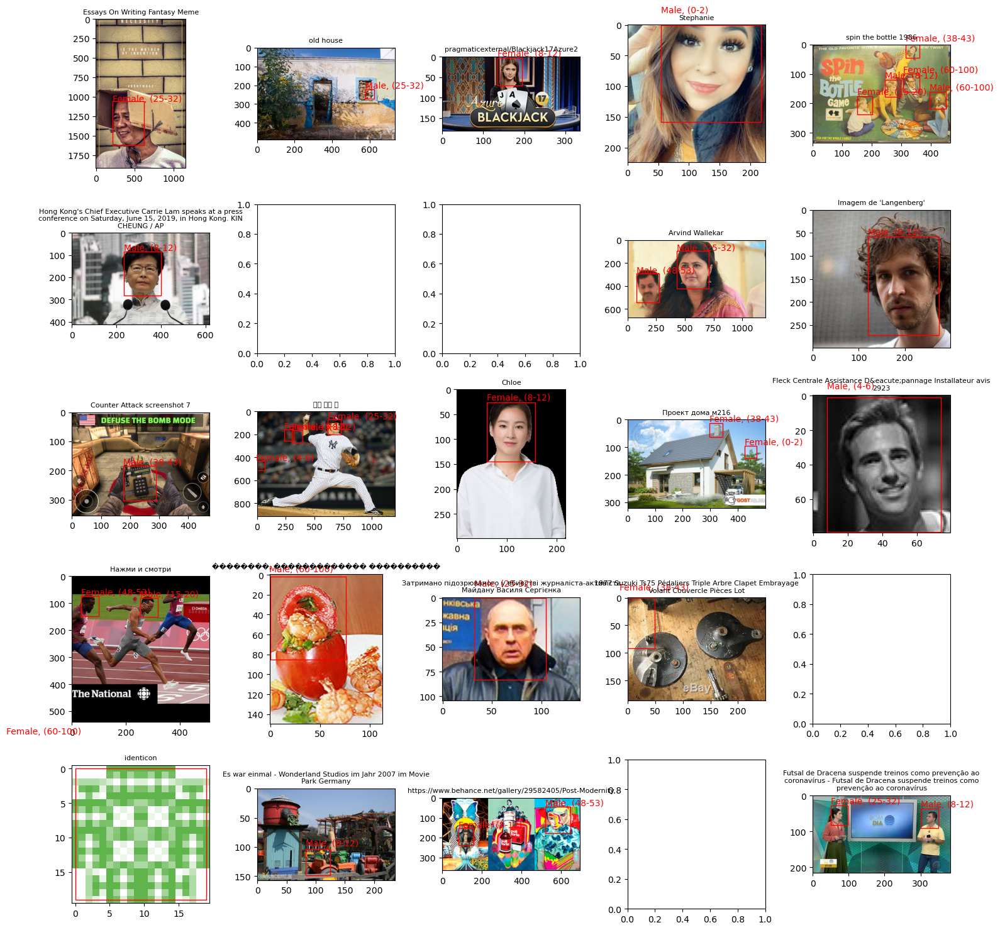

In [761]:
display_sample(sample_face_df, bounding_box=True)

ERROR HTTP Error 400: Bad Request
ERROR HTTP Error 404: 
ERROR HTTP Error 400: Bad Request
ERROR HTTP Error 400: Bad Request
ERROR HTTP Error 400: Bad Request


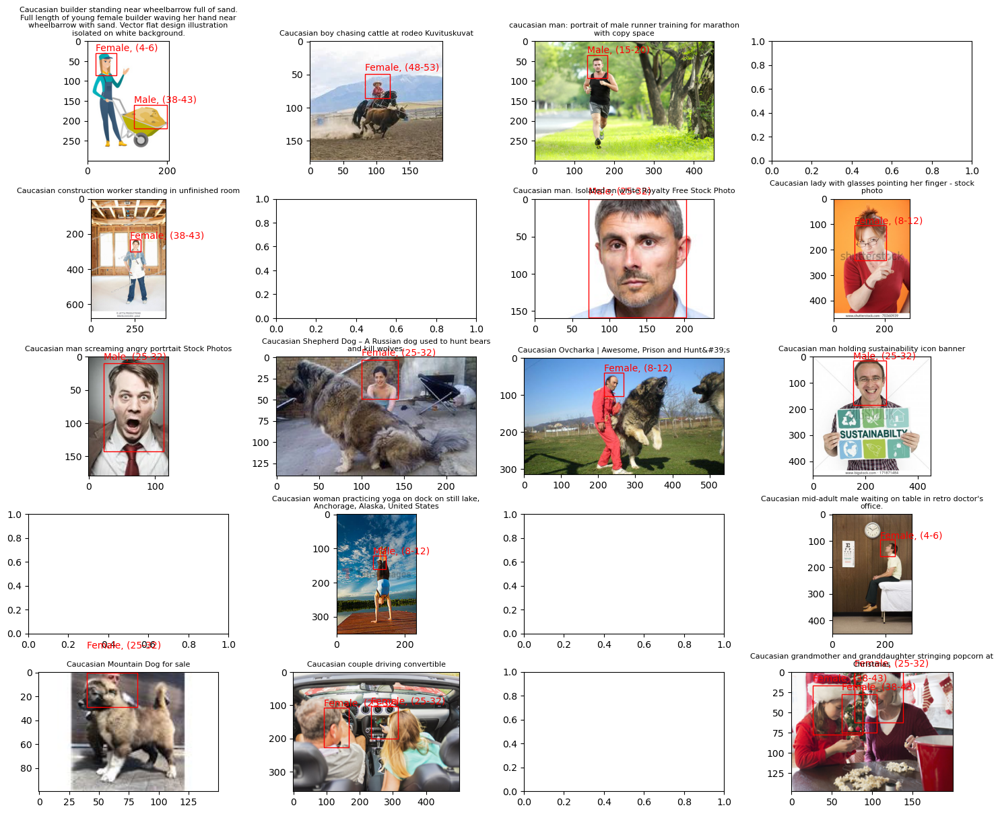

In [691]:
# age: \b(child(ren)?|young|old)\b
display_sample(face_df[face_df['text'].str.match(r'\bcaucasians?\b', case=False)], bounding_box=True)

In [663]:
face_df[face_df['text'].str.match(r'\bwom[ae]n\b')]

,uid,url,text,original_width,original_height,clip_b32_similarity_score,clip_l14_similarity_score,face_bboxes,sha256
9893,2efaeecedaffcc3d4ab07ebfc0863ef9,https://opinionatedmale.files.wordpress.com/20...,woman-writing-OpinionatedMale.com,378,414,0.252197,0.195679,"[[0.2825601398944855, 0.15044008195400238, 0.7...",e0496ccd3c9827f9130a40abc93978e1e94066b5cbd259...
14780,cd86b60f0f9c381dacf95bb3e5bc514f,https://cdn.xl.thumbs.canstockphoto.com/cansto...,woman touching her chin - face of beautiful wo...,174,238,0.236572,0.272461,"[[0.2212277054786682, 0.06951182335615158, 0.8...",058118d0951e15ca6a5e906f79f4a81878a934330301ce...
17974,1492dbc6d8ab7a6fc5ba72e6428a0e6a,https://image-tc.galaxy.tf/wijpeg-58xkdjadfyay...,woman leaning against a wooden door,860,645,0.222168,0.147461,"[[0.26945436000823975, 0.21006548404693604, 0....",b34211d3112d0d7d035f1b6a7dbb4d5ff756202b35bf6d...
39210,49ce3c3193104b12bb1e0434defc76fb,https://static.theceomagazine.net/wp-content/u...,women in leadership awards,1200,800,0.240601,0.200806,"[[0.3704124987125397, 0.1088607907295227, 0.48...",357faf4761c703d7a64439949508973bea5f6d0a16dcc0...
122189,6303d5f4566cc3c55efbc195ae7f2bb8,https://drdennislucas.com/wp-content/uploads/2...,woman with beautiful smile,500,350,0.248291,0.207886,"[[0.31585878133773804, 0.23313531279563904, 0....",a14d3a690b998980eeba79f11334a71b3ed61209611be8...
...,...,...,...,...,...,...,...,...,...
12686890,490ad6ac076c66a00d9e95e6599117dd,https://images.squarespace-cdn.com/content/v1/...,woman-eyebrow-shape-300x153.jpg,300,153,0.311523,0.288574,"[[0.0473855584859848, 0.1846647411584854, 1.0,...",e8b6ca0270ccb0080711fa61dbd0dd5c1813b95d6f03e1...
12720207,28f4d1f47877047cd5f721f81ea7ad49,http://usercontent1.hubstatic.com/5939310_f520...,women in advertisement essay Women in advertis...,520,790,0.287354,0.236572,"[[0.27069389820098877, 0.05912855267524719, 0....",0303049fbf0c7a770b9360188f5c242dc4ec29b1a70575...
12722968,e1a308d95b0a4f42b785ef680b727618,https://images.unsplash.com/photo-152210836235...,woman crying in front of mirror,1000,668,0.290039,0.256836,"[[0.3053361773490906, 0.5048922300338745, 0.35...",2ecf438b965f81982a4e121a9339e8e34ef82185d15ff9...
12730422,1acdc7a40bd69eac56fcb8640fbeb0a9,https://images.unsplash.com/photo-159893777703...,woman in white and black long sleeve shirt and...,1000,1250,0.270752,0.181641,"[[0.7806780934333801, 0.16753384470939636, 0.9...",400b3559991f300e0a448a7b038c6f205c1e566388ed88...


ERROR HTTP Error 401: Unauthorized
ERROR HTTP Error 404: Not Found
ERROR <urlopen error [Errno -2] Name or service not known>
ERROR 'NoneType' object is not subscriptable
ERROR <urlopen error [Errno -2] Name or service not known>
ERROR HTTP Error 404: Not Found


/home/hongrach/anaconda3/envs/representation/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 49324 (\N{HANGUL SYLLABLE SA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/home/hongrach/anaconda3/envs/representation/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 50857 (\N{HANGUL SYLLABLE YONG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/home/hongrach/anaconda3/envs/representation/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 51088 (\N{HANGUL SYLLABLE JA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/home/hongrach/anaconda3/envs/representation/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 49341 (\N{HANGUL SYLLABLE SAB}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/home/hongrach/anaconda3/envs/representation/lib/python3.9/site-packages/IPython/core/pylabtools.py:1

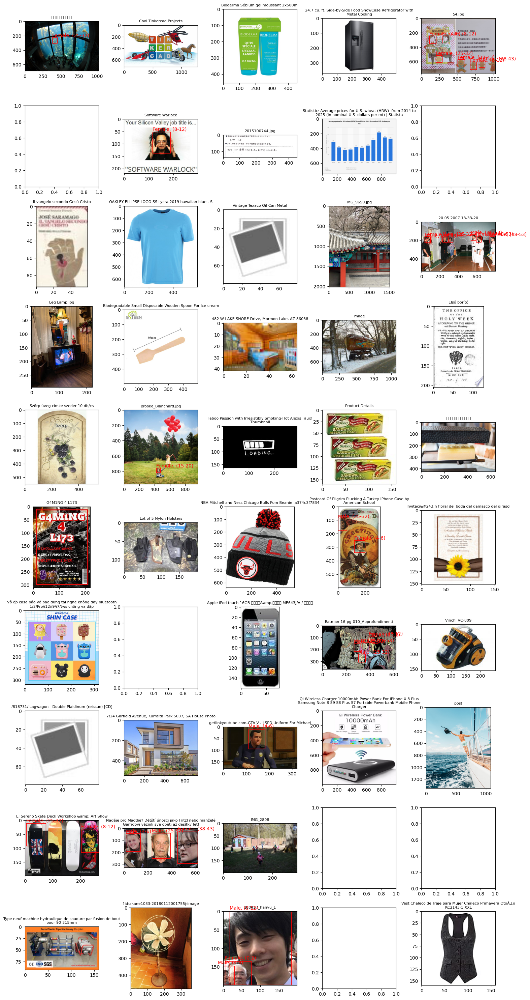

In [712]:
display_sample(df, bounding_box=True)

# Process images for CLIP

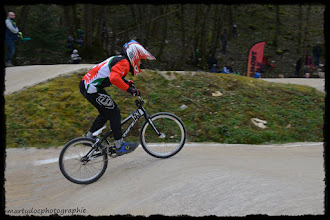

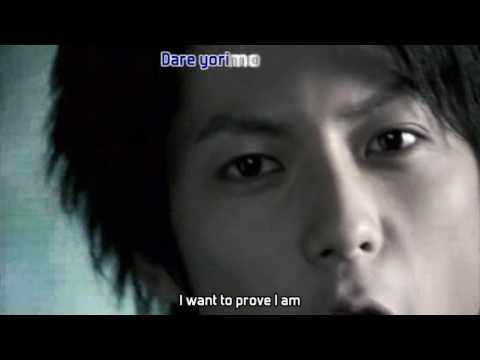

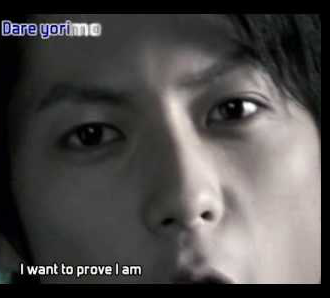

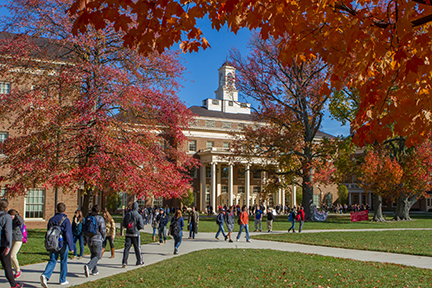

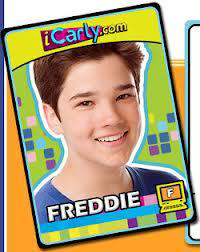

...

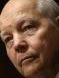

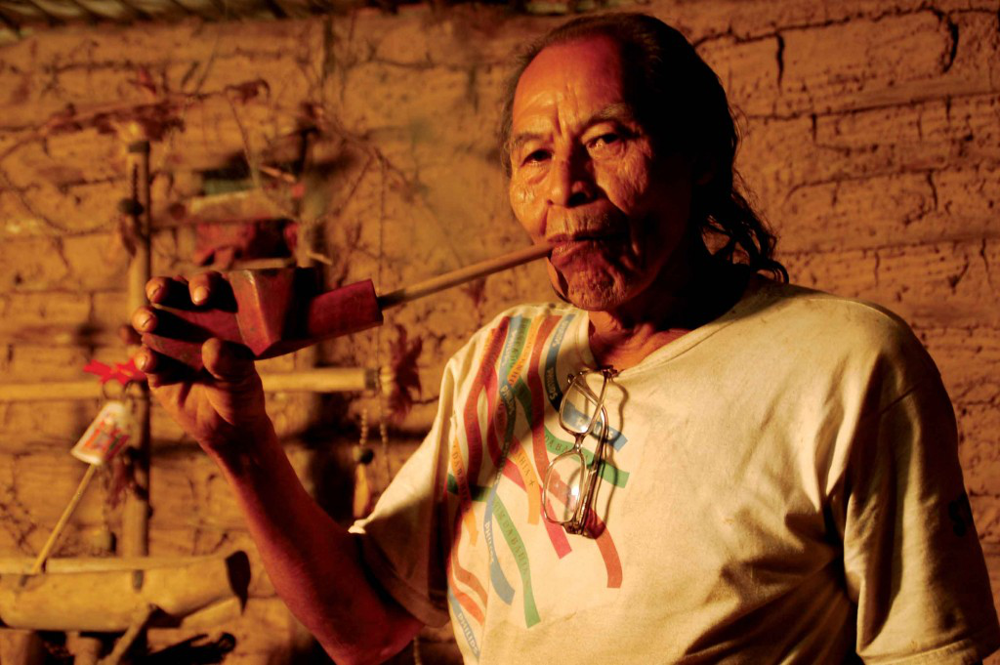

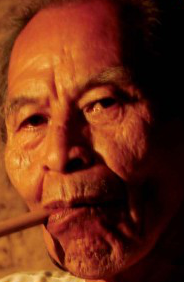

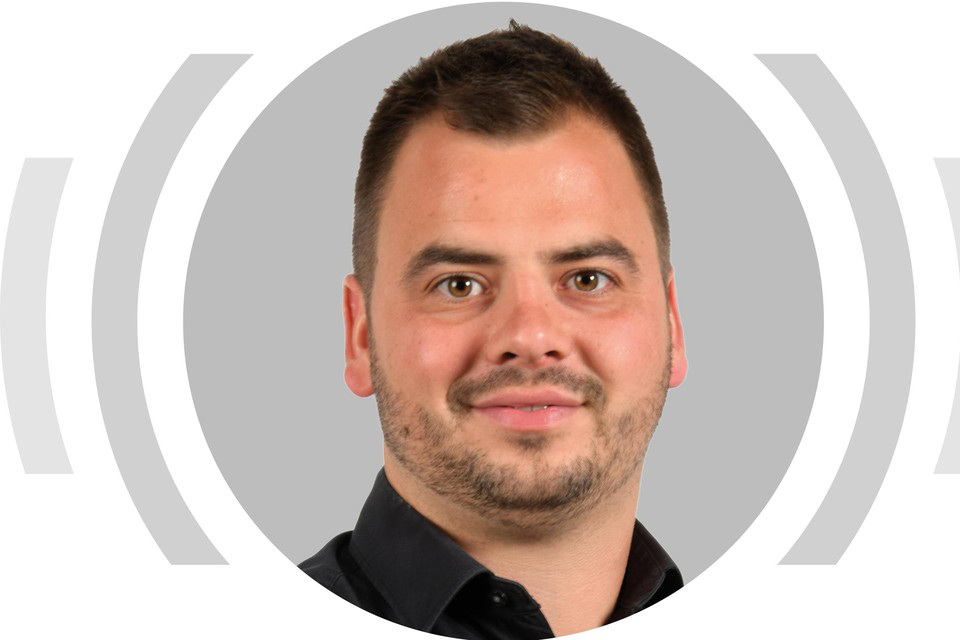

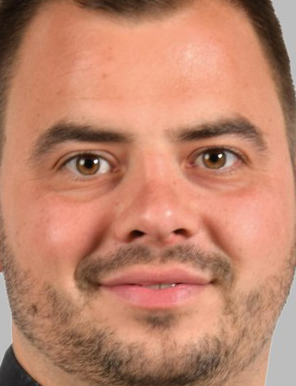

ValueError: Could not save to JPEG for display

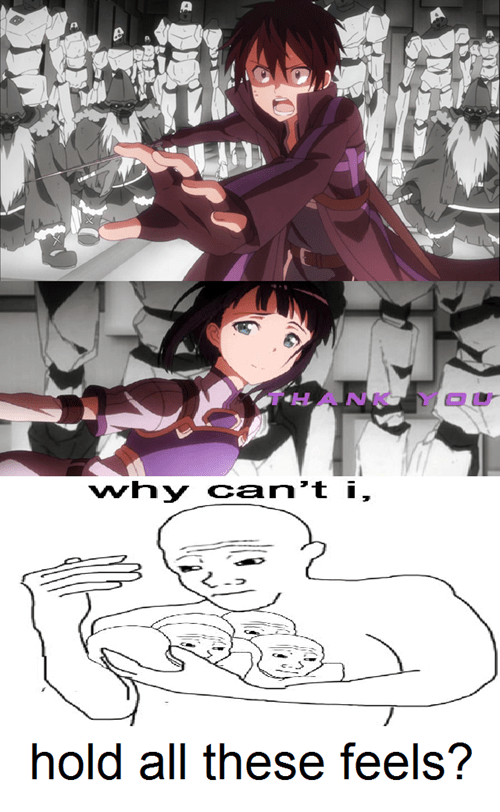

ValueError: Could not save to JPEG for display

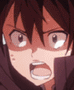

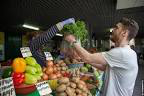

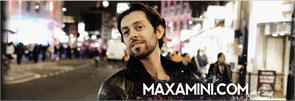

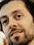

In [19]:
import os
import random
import re
import csv
import json
import numpy as np
import pandas as pd
# import torch
# import clip
from collections import defaultdict
from PIL import Image
import urllib.request as urlopen

def get_face_box(img, box, opencv=False):
    w, h = img.size
    if opencv:
        assert(len(box) >= 4)
        w1 = int(box[0] * w)
        h1 = int(box[1] * h)
        w2 = int(box[2] * w)
        h2 = int(box[3] * h)
    else:
        w1 = int(box['Left'] * w)
        h1 = int(box['Top'] * h)
        w2 = int((box['Left'] + box['Width']) * w)
        h2 = int((box['Top'] + box['Height']) * h)
    return (w1, h1, w2, h2)

def get_img_embedding(file, row):
    raw_img = Image.open(file)
    display(raw_img) #.show()
    # TRIM FACE
    (w1, h1, w2, h2) = get_face_box(raw_img, row['bounding_box']) # row['face_bboxes'][0])
#     if w2-w1 < 40 and h2-h1 < 40:
#         print("TOO SMALL")
    face_img = raw_img.crop((w1, h1, w2, h2))
    display(face_img) #.show()

#     final_img = preprocess(face_img).unsqueeze(0).to(device)
#     with torch.no_grad():
#         image_features = model.encode_image(final_img)
#         return image_features
    return None

sample_face_df_path = '~/datafiltering/face_rekognition_images_single_df.parquet'
sample_face_df = pd.read_parquet(sample_face_df_path)
for _, row in sample_face_df.sample(10).iterrows():
    uid = row['uid']
    img_path = row['img_path']
    e = get_img_embedding(img_path, row)


# Make df of rekognition single faces to pass through clip

## 100k

In [11]:
image_dir = os.path.join(scale_dir, 'face_images_100k')

face_df = df[df['face_bboxes'].apply(len) == 1]

sample_uids = []
uid_to_path = {}
for f in os.listdir(image_dir):
    if len(f.split('.')) == 2:
        uid = f.split('.')[0]
        sample_uids.append(uid)
        uid_to_path[uid] = os.path.join(image_dir, f)

sample_face_df = face_df.loc[face_df['uid'].isin(sample_uids)]
sample_face_df['img_path'] = sample_face_df['uid'].map(uid_to_path)
print(len(sample_face_df))
sample_face_df

102160


/tmp/ipykernel_1751980/1997037808.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sample_face_df['img_path'] = sample_face_df['uid'].map(uid_to_path)


,uid,url,text,original_width,original_height,clip_b32_similarity_score,clip_l14_similarity_score,face_bboxes,sha256,is_kept,img_path
21,99a30d51837ff755771611983e2d5048,https://vignette3.wikia.nocookie.net/gamingemp...,File:Uniformfive.PNG,267,322,0.250732,0.188721,"[[0.3625551164150238, 0.08790591359138489, 0.5...",8bc38bc842d610e57df8a522c25cf93a75064cfc29f28c...,False,/data/datacomp/small/face_images_100k/99a30d51...
276,a6a9845725138cb61430dde24df56c6f,http://f3.love.ru/k_QbK4_g2v4_8OLI3B6jnp712U.jpg,"Galina, 60, г.Будапешт",100,100,0.222290,0.161011,"[[0.3793940842151642, 0.2837512195110321, 0.61...",736aabe05a8f7d5808ef9fe0fa04979c4fa0be402e73c6...,False,/data/datacomp/small/face_images_100k/a6a98457...
304,5fa76945b3332cf9c34b6aeb42752d6f,http://static.zoonar.de/img/www_repository3/14...,Farmer with scythe and wheat crop,320,297,0.256104,0.311035,"[[0.46826690435409546, 0.12271303683519363, 0....",26ddef75d48dcd392f245b1ae5d8b100a7b66d8031a594...,True,/data/datacomp/small/face_images_100k/5fa76945...
342,acd2a8fed96cf4de91f16e94d7045165,http://item.ssgcdn.com/10/36/64/item/100003164...,"[센터폴][센터폴] 겨울 이월 나들이룩 모음 / 티셔츠, 바지, 아우터",350,350,0.206787,0.119202,"[[0.2541205585002899, 0.11937412619590759, 0.3...",e77fc97fd8aaee02ee4f60d3e682e30afc7aa4daeb1f90...,False,/data/datacomp/small/face_images_100k/acd2a8fe...
366,0deebb74f92ad3f74aa7f0154f1437ac,http://img2-ak.lst.fm/i/u/300x300/5aa54af59f77...,Image pour 'Under A Blanket Of Blue',300,300,0.200684,0.151489,"[[0.24424190819263458, 0.21789991855621338, 0....",5884388ace22ee2c43214ccc4ea8c2a3103d8cb8ce90ab...,False,/data/datacomp/small/face_images_100k/0deebb74...
...,...,...,...,...,...,...,...,...,...,...,...
12799167,799fccef76a874dffce42a35f3794fa5,https://image.over-blog.com/RMLvlc2xpxic7-zIQU...,Upseen: El Monstruo - Music Streaming - Listen...,170,170,0.270996,0.144897,"[[0.6264647245407104, 0.4220830798149109, 0.65...",e0832be8b3f1ed73011aa51bd5c5bd920f035d1dabe493...,False,/data/datacomp/small/face_images_100k/799fccef...
12799638,84782eef2f89c248fcd4ed12899098e9,http://p1-tt.byteimg.com/img/tos-cn-i-0022/c1c...,台风致寿光直接经济损失近10亿，弥河上有桥栏被冲毁,600,338,0.274658,0.228882,"[[0.1584044247865677, 0.25119855999946594, 0.2...",3b0dcced91b49c4932764d1bc5135bffe0bd38f6d861f4...,False,/data/datacomp/small/face_images_100k/84782eef...
12799713,75c45ca8590cae4590c1f260c1ba5e6c,https://cdn2.ackermanmusic.co.uk/img/SM/841122...,Symphony No.100 G Major Miniature Score,80,120,0.297852,0.244995,"[[0.47012263536453247, 0.7717082500457764, 0.5...",a57c4f5fe433e6e439c45761ad8b870fa436b76e5b10a9...,True,/data/datacomp/small/face_images_100k/75c45ca8...
12799833,ad8cb271a13352a73815917e8ac7eec3,https://steamcdn-a.akamaihd.net/steamcommunity...,Uniuniunicorn,32,32,0.204834,0.141479,"[[0.21164028346538544, 0.0, 0.6821593642234802...",0c049daa9338bb93342797db12618b9683f12c3613e6bd...,False,/data/datacomp/small/face_images_100k/ad8cb271...


In [12]:
sample_face_df[
    ['uid', 'is_kept', 'clip_l14_similarity_score', 'face_bboxes', 'img_path']
].to_parquet('~/datafiltering/face_images_100k_single_df.parquet')

## 1M

In [14]:
face_df

,uid,url,text,original_width,original_height,clip_b32_similarity_score,clip_l14_similarity_score,face_bboxes,sha256,is_kept
0,68ba78085ddc76780dfbceec1e5d42ac,https://photos.smugmug.com/Desert-100/2017-Des...,IMG_1788,300,450,0.216797,0.201050,"[[0.4974687993526459, 0.1723930984735489, 0.60...",6b41923887605276f22fcca29c0e5329881a1657231a6d...,False
1,1f7b134d137b77f043c2d984c819d099,http://173.214.250.35/76ZwuWvsbgwP082uQJ2VnncH...,Diana frank le klloun,320,240,0.235962,0.123596,"[[0.29118314385414124, 0.08071886003017426, 0....",51e908323fd708b14ce4a435d3879456caa0c1dd362cfa...,False
2,2a2bb8d1fc6e43d272c009d825d8a423,https://a.wattpad.com/useravatar/thisisastandu...,thisisastandup69,128,128,0.134521,0.151978,"[[0.2151436060667038, 0.33176833391189575, 0.6...",8751821e52e07231305bbe6f8e2dd6169875946ab03202...,False
3,0c4af8720b06e5e30fd14c9333c69163,https://static.wixstatic.com/media/9f980f_e34c...,lidar 2.JPG,286,190,0.219849,0.258301,"[[0.7299515604972839, 0.14564916491508484, 0.7...",45591f6ef827fdfd322f8bbe5f654486c2220d0cce9454...,True
4,48bc9d12f9fdbfb7cad8816627a16eb4,https://img1.etsystatic.com/027/0/6615545/il_3...,1 Yd 3/4&quot; Wide Gorgeous Vintage Victorian...,340,270,0.342285,0.301025,"[[0.3746822476387024, 0.005450154189020395, 0....",3bc50d0844aa51e86b690cef5bce91c086f0d9e0afd7ef...,True
...,...,...,...,...,...,...,...,...,...,...
12799964,c62fe9a285b22688297f00578e2157d3,https://i.pinimg.com/236x/d9/de/46/d9de468cbb7...,[New Music]- @MeanzMusic- No Apologies | voice...,236,236,0.322754,0.274414,"[[0.4042377173900604, 0.160688579082489, 0.601...",8ebe41c4525fae722dd3a46b5dea930c19fa9e96406e68...,True
12799968,b3654c4dad4ac3de5d77fa434976d59d,https://daaam.info/wp-content/gallery/DAAAM_20...,daaam_2017_zadar_17_the_6th_ds_city_walk_033,240,160,0.307373,0.224243,"[[0.7017708420753479, 0.43615323305130005, 0.7...",42ba7028f6320a2dffeb26f9c095aa7f754ac515accd61...,False
12799970,c5ecc238130ebc7c5fa86ef6eb4d7a79,https://stopga.me/images/games/logos/13380/c17...,Rambo: The Video Game: Обзор,170,119,0.339111,0.277832,"[[0.5128694772720337, 0.45578712224960327, 0.5...",30f43f8d377e1cebdea9e948de022eff66381bcbe6f0a3...,True
12799971,3845815c9a54174b75b18dca0647d80d,http://sk-menina.si/wp-content/uploads/2016/09...,OLYMPUS DIGITAL CAMERA,150,113,0.207031,0.063232,"[[0.690801203250885, 0.635551929473877, 0.7224...",ee1e1e2442815641099b42b581f75497e456f4c3137164...,False


In [17]:
face_df[
    ['uid', 'is_kept', 'clip_l14_similarity_score', 'url', 'face_bboxes']
].to_parquet('~/datafiltering/face_images_2M_single_df.parquet')